In [6]:
# Loading the dataset
# Import pandas library
import pandas as pd
# Import numpy
import numpy as np
# Reading the dataset
mydata = pd.read_csv('FPD-area-radiusandulna-aim.csv')

In [7]:
mydata.head()

,URN,R_area,U_area,AIM
0,FL008_PD_001,0.0,0.0,309
1,FL008_PD_002,0.0,0.0,309
2,FL008_PD_003,0.0,0.0,309
3,FL008_PD_004,0.0,0.0,309
4,FL008_PD_005,0.0,0.0,309


In [8]:
mydata.describe()

,R_area,U_area,AIM
count,1543.000000,1543.000000,1543.000000
mean,75.204326,26.823137,235.368114
std,134.032397,63.377175,53.741738
min,0.000000,0.000000,125.000000
25%,0.000000,0.000000,188.000000
50%,0.000000,0.000000,237.000000
75%,90.062500,0.000000,283.000000
max,702.750000,410.625000,323.000000


In [9]:
mydata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1543 entries, 0 to 1542
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   URN     1543 non-null   object 
 1   R_area  1543 non-null   float64
 2   U_area  1543 non-null   float64
 3   AIM     1543 non-null   int64  
dtypes: float64(2), int64(1), object(1)
memory usage: 48.3+ KB


In [10]:
X = mydata.drop(['URN', 'AIM'], axis = 1)
print(X)

      R_area  U_area
0        0.0     0.0
1        0.0     0.0
2        0.0     0.0
3        0.0     0.0
4        0.0     0.0
...      ...     ...
1538     0.0     0.0
1539     0.0     0.0
1540     0.0     0.0
1541     0.0     0.0
1542     0.0     0.0

[1543 rows x 2 columns]


In [11]:
y = mydata['AIM']
print(y)

0       309
1       309
2       309
3       309
4       309
       ... 
1538    209
1539    209
1540    209
1541    209
1542    209
Name: AIM, Length: 1543, dtype: int64


In [12]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor

# Splitting the dataset in train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state=0)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1080, 2) (463, 2) (1080,) (463,)


In [13]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1080 entries, 720 to 684
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   R_area  1080 non-null   float64
 1   U_area  1080 non-null   float64
dtypes: float64(2)
memory usage: 25.3 KB


In [14]:
y_train.info()

<class 'pandas.core.series.Series'>
Int64Index: 1080 entries, 720 to 684
Series name: AIM
Non-Null Count  Dtype
--------------  -----
1080 non-null   int64
dtypes: int64(1)
memory usage: 16.9 KB


In [15]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 463 entries, 1041 to 634
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   R_area  463 non-null    float64
 1   U_area  463 non-null    float64
dtypes: float64(2)
memory usage: 10.9 KB


In [16]:
y_test.info()

<class 'pandas.core.series.Series'>
Int64Index: 463 entries, 1041 to 634
Series name: AIM
Non-Null Count  Dtype
--------------  -----
463 non-null    int64
dtypes: int64(1)
memory usage: 7.2 KB


In [17]:
pd.set_option('display.max_rows', 500)
print(y_test)

1041    153
159     245
1456    252
744     281
790     232
685     306
898     231
82      175
520     310
870     298
1142    227
1280    313
724     202
527     274
361     276
794     232
936     131
66      183
958     252
171     179
1133    224
9       235
342     181
465     202
53      179
299     156
641     245
54      179
229     287
1292    268
399     293
1475    199
1154    233
1114    190
1137    318
597     309
233     287
1271    174
953     300
303     156
1358    220
513     167
431     314
34      245
1529    318
996     319
464     202
906     221
253     296
390     213
1460    166
884     159
1413    269
1089    147
1317    310
364     276
204     320
254     237
278     235
187     262
141     265
227     293
19      166
1243    238
1339    156
422     243
182     273
1348    220
983     151
434     314
1083    147
1375    269
333     184
1254    176
758     240
1365    284
535     274
991     319
688     306
1401    308
1482    199
161     245
1150    227
667 

In [18]:
# Decision Tree Regression model
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Instantiation of the model

model = DecisionTreeRegressor()
pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('reduce_dim', PCA()),
        ('regressor', model)
        ])

In [19]:
# Fitting the model
Age_dt = model.fit(X_train, y_train)

In [20]:
# Training model evaluation
from sklearn import metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score, r2_score
from sklearn.metrics import mean_absolute_percentage_error

# Prediction on the training dataset
ytrain_pred = Age_dt.predict(X_train)

# The r-sq
print('The training r_sq is: %.2f' % Age_dt.score(X_train, y_train))

# The MAE
print('The MAE is: %.2f' % mean_absolute_error(y_train, ytrain_pred))

# The MAPE 
print('The MAPE is: %.2f' % mean_absolute_percentage_error(y_train, ytrain_pred))

# The MSE
print('The MSE is: %.2f' % mean_squared_error(y_train, ytrain_pred))

# The RMSE
print('The RMSE is: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))

# The EVS
print('The EVS is: %.2f' % explained_variance_score(y_train, ytrain_pred))

The training r_sq is: 0.73
The MAE is: 18.54
The MAPE is: 0.07
The MSE is: 794.96
The RMSE is: 28.20
The EVS is: 0.73


In [21]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(Age_dt, X_train, y_train, scoring = 'neg_mean_squared_error', cv = 10)
rf_rmse_scores = np.sqrt(-scores)

In [22]:
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())
display_scores(rf_rmse_scores)

Scores: [36.21923529 38.72956752 41.62343143 39.86163085 35.56072115 37.79130538
 36.92707771 38.43296417 33.7396601  41.57825688]
Mean: 38.04638504905641
Standard deviation: 2.4199891334834653


In [23]:
from sklearn.model_selection import GridSearchCV

param_grid = [
    {'max_features': [2, 4, 6, 8]}, 
    {'max_features': [2, 4, 6, 8], 'max_depth': [2, 4, 8, 16, 36, 64]}
]

Age_dt = DecisionTreeRegressor()

grid_search = GridSearchCV(Age_dt, param_grid, cv= 10, scoring='neg_mean_squared_error', return_train_score=True)
grid_search.fit(X_train, y_train)
grid_search.best_params_

{'max_depth': 4, 'max_features': 2}

In [24]:
grid_search.best_estimator_

DecisionTreeRegressor(max_depth=4, max_features=2)

In [25]:
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres ["params"]):
    print(np.sqrt(-mean_score), params)

38.126537172700516 {'max_features': 2}
38.26033464505617 {'max_features': 4}
38.23296599314742 {'max_features': 6}
38.32864057898697 {'max_features': 8}
34.623593231037766 {'max_depth': 2, 'max_features': 2}
34.623593231037766 {'max_depth': 2, 'max_features': 4}
34.623593231037766 {'max_depth': 2, 'max_features': 6}
34.623593231037766 {'max_depth': 2, 'max_features': 8}
34.4973872737653 {'max_depth': 4, 'max_features': 2}
34.4973872737653 {'max_depth': 4, 'max_features': 4}
34.4973872737653 {'max_depth': 4, 'max_features': 6}
34.4973872737653 {'max_depth': 4, 'max_features': 8}
35.365006394761686 {'max_depth': 8, 'max_features': 2}
35.394933645431486 {'max_depth': 8, 'max_features': 4}
35.4097268522088 {'max_depth': 8, 'max_features': 6}
35.37503349017729 {'max_depth': 8, 'max_features': 8}
37.76645426794144 {'max_depth': 16, 'max_features': 2}
37.72126527544831 {'max_depth': 16, 'max_features': 4}
37.71659194153743 {'max_depth': 16, 'max_features': 6}
37.76766648548094 {'max_depth': 1

In [26]:
print('The training r_sq is: %.2f' % grid_search.best_estimator_.score(X_train, y_train))

The training r_sq is: 0.63


from sklearn.pipeline import Pipeline

f_list = list(X.columns)
f_importance = pd.Series(grid_search.best_estimator_.feature_importances_, index = f_list).sort_values(ascending = False)
print(f_importance)

In [27]:
# Create final model - Age_dt or grid_search.best_estimator

final_model = Age_dt

In [28]:
# Prediction on the testing data
final_model.fit(X_train, y_train)
final_prediction = final_model.predict(X_test)

In [29]:
print(final_prediction)

[153.         235.         267.14761905 267.14761905 267.14761905
 267.14761905 267.14761905 173.5        267.14761905 267.14761905
 267.14761905 267.14761905 200.         267.14761905 267.14761905
 267.14761905 127.         215.         267.14761905 179.
 267.14761905 184.         177.         189.         166.
 133.         267.14761905 235.         267.14761905 267.14761905
 267.14761905 267.14761905 267.14761905 166.         267.14761905
 267.14761905 267.14761905 181.         267.14761905 265.
 267.14761905 177.         267.14761905 267.14761905 267.14761905
 267.14761905 156.         267.14761905 267.14761905 183.
 156.         149.         267.14761905 243.         267.14761905
 267.14761905 267.14761905 267.14761905 190.         267.14761905
 243.         267.14761905 163.         267.14761905 186.
 201.         267.14761905 267.14761905 177.         267.14761905
 156.         267.14761905 125.         182.         267.14761905
 267.14761905 267.14761905 267.14761905 267.147619

In [42]:
# The testing coef. of determination

print('The testing r_sq is: %.2f' % final_model.score(X_test, y_test))

# The metrics 
# The MAE
print('The MAE is: %.2f' % mean_absolute_error(y_test, final_prediction))

# The MAPE 
print('The MAPE is: %.2f' % mean_absolute_percentage_error(y_test, final_prediction))

# The MSE
print('The MSE is: %.2f' % mean_squared_error(y_test, final_prediction))

# The RMSE
print('The RMSE is:', np.sqrt(mean_squared_error(y_test, final_prediction)))

# The EVS
print('The EVS is: %.2f' % explained_variance_score(y_test, final_prediction))

The testing r_sq is: 0.52
The MAE is: 29.76
The MAPE is: 0.13
The MSE is: 1345.10
The RMSE is: 36.675551148169
The EVS is: 0.52


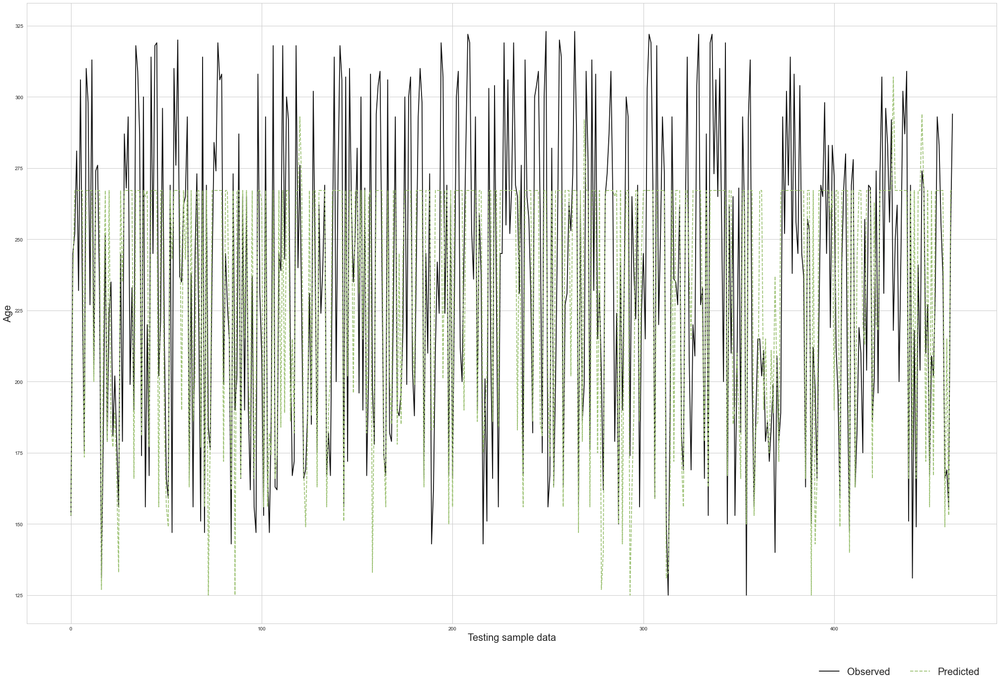

In [39]:
# Plotting the observed and predicted data
import matplotlib.pyplot as plt
#Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (35,23)
x_ax = range(len(X_test))
# Plotting
plt.plot(x_ax, y_test, label = 'Observed', color = 'k', linestyle = '-')
plt.plot(x_ax, final_prediction, label = 'Predicted', color = 'g', linestyle = '--')
plt.ylabel('Age', fontsize = "20")
plt.xlabel('Testing sample data', fontsize = "20")
plt.legend(bbox_to_anchor = (0.9, -0.1), loc = 'lower center', fontsize = "20", ncol = 2, frameon = False)

/Users/vpanci/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


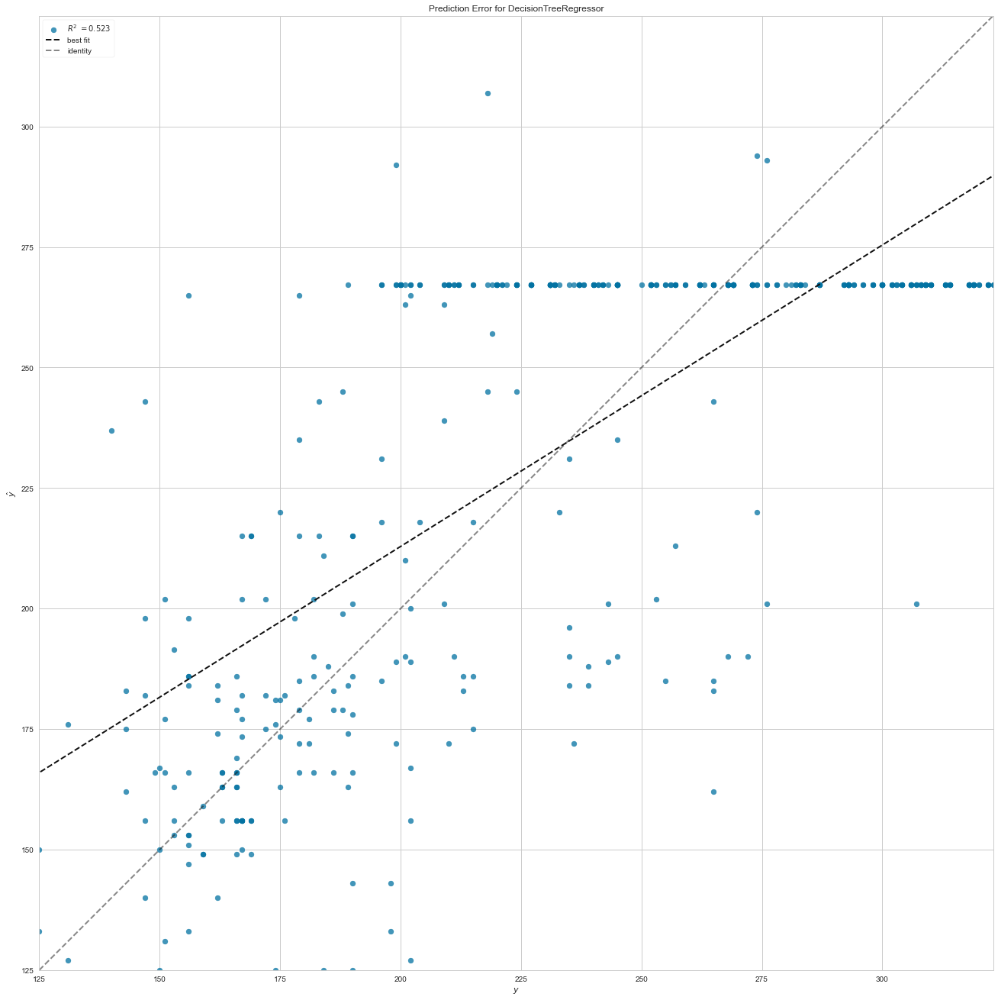

<AxesSubplot:title={'center':'Prediction Error for DecisionTreeRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [40]:
# Plotting the prediction errors
from yellowbrick.regressor import PredictionError
visualizer = PredictionError(final_model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

/Users/vpanci/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


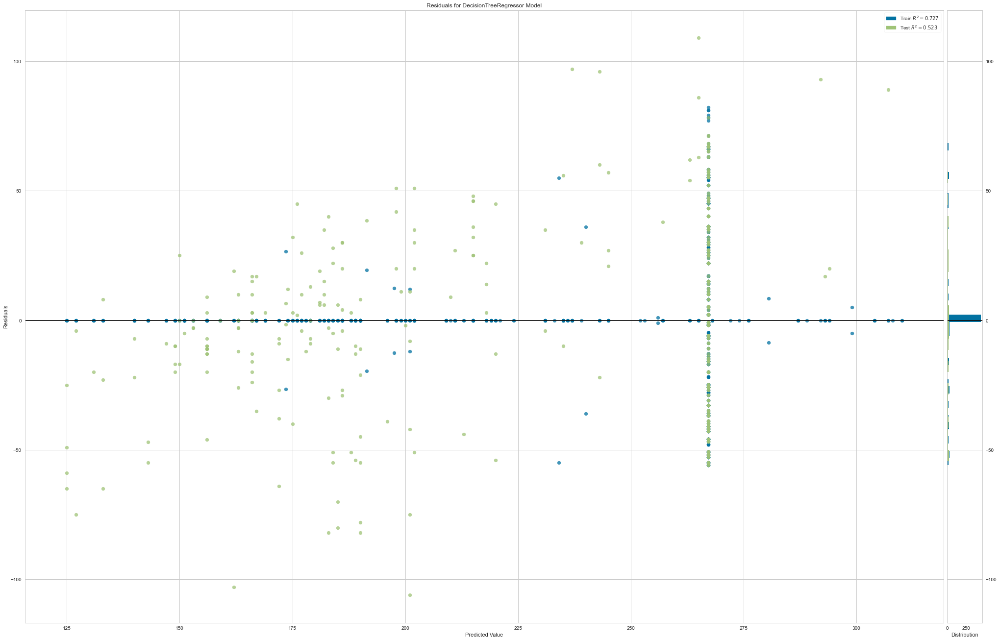

<AxesSubplot:title={'center':'Residuals for DecisionTreeRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [41]:
# Plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer = ResidualsPlot(final_model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

# Visualise the decision trees of the RFR
from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import os
!pip install pydotplus
import pydotplus

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\lib\graphviz"
dot_data = StringIO()
export_graphviz(pipe.named_steps['regressor'].estimators_[0], out_file=dot_data)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
Image(graph.create_png())

In [34]:
# Random Forest Feature Ranking
from sklearn.pipeline import Pipeline

In [35]:
f_list = list(X.columns)
f_importance = pd.Series(final_model.feature_importances_, index = f_list).sort_values(ascending = False)

In [36]:
print(f_importance)

R_area    0.913106
U_area    0.086894
dtype: float64


In [37]:
# Visualise the decision trees 
from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import os
!pip install pydotplus
import pydotplus

# plotting tree 
dot_data = StringIO()  

export_graphviz(final_model, out_file=dot_data, filled=True, rounded=True,
                feature_names=X.columns, 
                class_names=['R1', "U"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# Pearson's correlation

# Pearson's correlation set up
import matplotlib.pyplot as plt
import seaborn as sb
from pylab import rcParams 
import scipy 
from scipy.stats.stats import pearsonr

%matplotlib inline 
rcParams['figure.figsize'] = 8,4
plt.style.use('seaborn-whitegrid')

mydata = pd.read_csv('FT1-area-radiusandulna-aim.csv')
mydata.columns = ['URN', 'R_area', 'U_area', 'Age']
X = mydata.drop(['URN', 'Age'], axis = 1)
y = mydata['Age']
fig,axis = plt.subplots (2,2, figsize = (15,10))
sb.scatterplot (x = 'R_area', y = 'Age', data = mydata, ax=axis[0,0])
sb.scatterplot (x = 'U_area', y = 'Age', data = mydata, ax=axis[0,1])
#sb.scatterplot (x = 'Rep_area', y = 'Age_in_months', data = mydata, ax=axis[1,0])
#sb.scatterplot (x = 'Uep_area', y = 'Age_in_months', data = mydata, ax=axis[1,1])
plt.show()

corr1,_ = pearsonr(mydata['Age'], mydata['R_area'])
corr2,_ = pearsonr(mydata['Age'], mydata['U_area'])
print(corr1)
print(corr2)

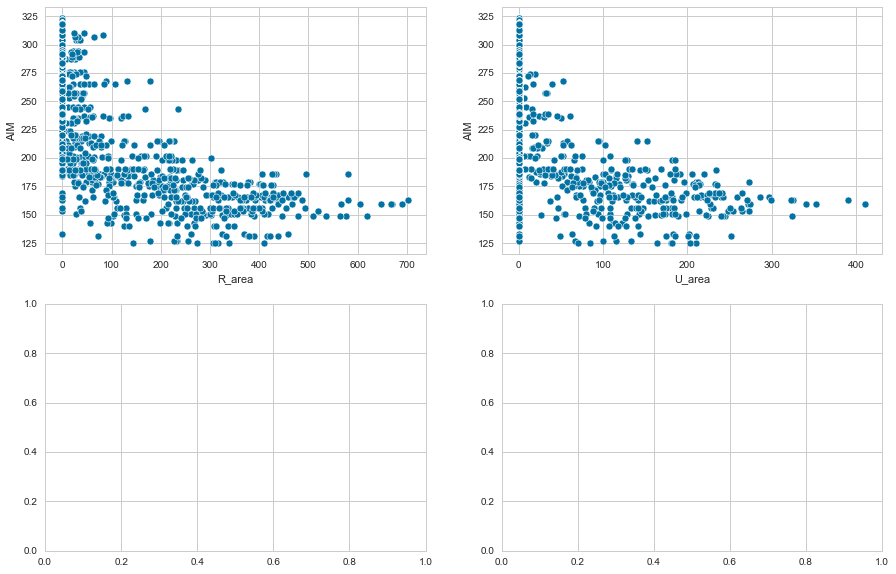

-0.6849922203046438
-0.5394507418483954


In [38]:
# Pearson's correlation

# Pearson's correlation set up
import matplotlib.pyplot as plt
import seaborn as sb
from pylab import rcParams 
import scipy 
from scipy.stats.stats import pearsonr

%matplotlib inline 
rcParams['figure.figsize'] = 8,4
plt.style.use('seaborn-whitegrid')

mydata = pd.read_csv('FPD-area-radiusandulna-aim.csv')
mydata.columns = ['URN', 'R_area', 'U_area', 'AIM']
X = mydata.drop(['URN', 'AIM'], axis = 1)
y = mydata['AIM']
fig,axis = plt.subplots (2,2, figsize = (15,10))
sb.scatterplot (x = 'R_area', y = 'AIM', data = mydata, ax=axis[0,0])
sb.scatterplot (x = 'U_area', y = 'AIM', data = mydata, ax=axis[0,1])
#sb.scatterplot (x = 'Rep_area', y = 'Age_in_months', data = mydata, ax=axis[1,0])
#sb.scatterplot (x = 'Uep_area', y = 'Age_in_months', data = mydata, ax=axis[1,1])
plt.show()

corr1,_ = pearsonr(mydata['AIM'], mydata['R_area'])
corr2,_ = pearsonr(mydata['AIM'], mydata['U_area'])
print(corr1)
print(corr2)